<a href="https://colab.research.google.com/github/ravindrabharathi/AVS-provisioning-Java/blob/master/019_rb_chart_generator_counts_growth_rate_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Config

In [12]:
import random
import numpy as np
import pandas as pd
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler

In [13]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [14]:
!ls '/gdrive/MyDrive/PISCHOOL/'

'2022-01-04 - Trends Forecast -Review - Week 4 .pptx'
'blind_labeling_df (1).csv'
 blind_labeling_df.csv
 company1_queries.xlsx
 company2_queries.xlsx
 ET_NET_grant_counts_monthly.csv
 ET_NET_patents_counts.csv
 ET_NET_patents_counts_monthly.csv
 ET_NET_project_counts_monthly.csv
 paper_data_processed_25k.npy
 +papers_data.pkl
 papers_data.pkl
 patents_counts_total.csv
 patents_dates.csv
 post-processed-packages_water_366k.json
 processed-packages_water_366k.json
 processed-papers_water_366k.zip
 queries_dataset_mature_sectors.csv
 queries_dataset_mature_tech.csv
 responseQPatent.json
 responseQProject.json


# Load Datasets

In [15]:
datasets = {
    'patents': '/gdrive/MyDrive/PISCHOOL/ET_NET_patents_counts_monthly.csv', 
    'projects': '/gdrive/MyDrive/PISCHOOL/ET_NET_project_counts_monthly.csv',
    'grants': '/gdrive/MyDrive/PISCHOOL/ET_NET_grant_counts_monthly.csv',
}

patents_df = pd.read_csv(datasets['patents'], parse_dates=['date'])

# get queries from dataset
queries = []
for col in patents_df.columns:
  if '_normalized_count' not in col:
    queries.append(col)

queries.remove('date')
queries.remove('total_count')
queries.remove('year')
queries.remove('month')
print(len(queries),queries)

611 ['"cloud computing"', '"motor boat"', '"nuclear reactor"', '"carbon dating"', '"hydraulic jack"', '"mechanical saw"', 'resistor', 'fishing', 'metallurgy', 'aluminium', 'tin', 'iron', 'non stick', 'teflon', 'nylon', 'sunglasses', '"camera lens"', '"water sensor"', '"heat sensor"', 'thermostat', '"heat pump"', 'tractor', '"hydraulic pump"', 'turbine', 'Automobile', '"Mobile phone"', '"Air conditioner"', '"washing machine"', 'refridgerator', 'motorbike', 'apparel', 'footwear', 'ecommerce', 'cd-rom', 'dvd-rom', '"1g networks"', '"2g networks"', '"usb 2"', 'mpeg1', 'mpeg2', '"servo motor"', 'ecg', 'echocardiogram', '"magnetic tape"', 'transistor', 'radio', 'telegram', '"mechanical hard disk"', '"digital camera"', '"slr camera"', '"floppy disk drive"', 'construction', '"QWERTY Keyboard"', 'Telephone', 'Watch', 'Bicycle', 'television', 'telephone', 'x-ray', '"cathode ray tube"', 'semiconductor', '"alkaline battery"', '"closed ecological system"', '"h101 virus"', '"computer interface"', '"

In [16]:
patents_df['date'] = patents_df['date'].dt.date
patents_df = patents_df[['date','total_count'] + queries]
#patents_df = patents_df[patents_df['date']<=pd.Timestamp('2020-12-01')]
patents_df

,date,total_count,"""cloud computing""","""motor boat""","""nuclear reactor""","""carbon dating""","""hydraulic jack""","""mechanical saw""",resistor,fishing,metallurgy,aluminium,tin,iron,non stick,teflon,nylon,sunglasses,"""camera lens""","""water sensor""","""heat sensor""",thermostat,"""heat pump""",tractor,"""hydraulic pump""",turbine,Automobile,"""Mobile phone""","""Air conditioner""","""washing machine""",refridgerator,motorbike,apparel,footwear,ecommerce,cd-rom,dvd-rom,"""1g networks""","""2g networks""","""usb 2""",...,"""robotic surgery""","""zero-energy building""","""eyetap""","""bioshelter""","""electrorheological fluid""","""life extension""","""space colonies""","""self checkout""","""nano-ram""","""stealth technology""","""air pollution""","""coilgun""","""aircraft flight control system""","""boeing x-51 waverider""","""autonomous rail rapid transit""","""dedicated short-range communications""","""biosphere 2""","""genetically modified food""","""propellant depot""","""autonomous research robot""","""conductive polymer""","""3d xpoint""","""virtusphere""","""desertec""","""maglev train""","""fusion rocket""","""optical transistor""","""carbon nanotubes""","""spin gravity""","""explosively pumped flux compression generator""","""immortality""","""orbital ring""","""ocean thermal energy conversion""","""quantum computer""","""metamaterial cloaking""","""linimo""","""programmable metallization cell""","""deep cryogenic treatment""","""strategies for engineered negligible senescence""","""directed energy weapon"""
0,1960-01-01,12377,0,0,22,0,1,0,30,9,6,50,12,74,96,0,22,0,0,0,0,15,1,19,0,46,19,0,11,14,0,0,1,14,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1960-02-01,15380,0,0,26,0,4,0,69,7,10,163,28,130,223,1,52,0,0,0,0,24,2,30,6,66,22,0,9,14,0,0,2,20,0,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1960-03-01,17285,0,1,27,0,7,0,87,9,8,118,26,136,267,1,62,0,1,0,0,37,0,38,7,68,26,0,8,13,0,0,2,23,0,7,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1960-04-01,15135,0,0,17,0,4,0,66,12,7,169,40,140,224,0,36,0,0,0,0,22,2,44,1,67,24,1,9,11,0,0,0,16,0,7,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1960-05-01,17232,0,0,32,0,12,0,87,12,10,181,44,146,271,0,43,0,0,0,0,26,0,43,6,79,27,1,13,11,0,0,2,22,0,11,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,2021-08-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
740,2021-09-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
741,2021-10-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
742,2021-11-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [17]:
projects_df = pd.read_csv(datasets['projects'], parse_dates=['date'])
projects_df['date'] = projects_df['date'].dt.date
projects_df = projects_df[['date','total_count'] + queries]
projects_df

,date,total_count,"""cloud computing""","""motor boat""","""nuclear reactor""","""carbon dating""","""hydraulic jack""","""mechanical saw""",resistor,fishing,metallurgy,aluminium,tin,iron,non stick,teflon,nylon,sunglasses,"""camera lens""","""water sensor""","""heat sensor""",thermostat,"""heat pump""",tractor,"""hydraulic pump""",turbine,Automobile,"""Mobile phone""","""Air conditioner""","""washing machine""",refridgerator,motorbike,apparel,footwear,ecommerce,cd-rom,dvd-rom,"""1g networks""","""2g networks""","""usb 2""",...,"""robotic surgery""","""zero-energy building""","""eyetap""","""bioshelter""","""electrorheological fluid""","""life extension""","""space colonies""","""self checkout""","""nano-ram""","""stealth technology""","""air pollution""","""coilgun""","""aircraft flight control system""","""boeing x-51 waverider""","""autonomous rail rapid transit""","""dedicated short-range communications""","""biosphere 2""","""genetically modified food""","""propellant depot""","""autonomous research robot""","""conductive polymer""","""3d xpoint""","""virtusphere""","""desertec""","""maglev train""","""fusion rocket""","""optical transistor""","""carbon nanotubes""","""spin gravity""","""explosively pumped flux compression generator""","""immortality""","""orbital ring""","""ocean thermal energy conversion""","""quantum computer""","""metamaterial cloaking""","""linimo""","""programmable metallization cell""","""deep cryogenic treatment""","""strategies for engineered negligible senescence""","""directed energy weapon"""
0,1960-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1960-02-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1960-03-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1960-04-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1960-05-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,2021-08-01,2096,2,0,2,0,0,0,0,4,5,3,0,13,283,0,0,0,0,0,0,0,5,1,0,8,3,3,13,1,0,0,2,1,0,5,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,1,0,0,0,0,12,0,0,0,0,0,0
740,2021-09-01,1972,2,0,7,0,0,0,0,9,4,0,1,9,235,2,0,0,0,0,0,0,2,1,0,7,0,4,2,0,0,0,0,0,0,3,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,0,0,5,0,0,0,0,0,0
741,2021-10-01,454,2,0,0,0,0,0,0,1,0,0,0,4,72,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,0,0,0,0,0
742,2021-11-01,133,1,0,0,0,0,0,0,0,0,0,0,1,15,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [18]:
grants_df = pd.read_csv(datasets['grants'], parse_dates=['date'])
grants_df['date'] = grants_df['date'].dt.date
grants_df = grants_df[['date','total_count'] + queries]
grants_df

,date,total_count,"""cloud computing""","""motor boat""","""nuclear reactor""","""carbon dating""","""hydraulic jack""","""mechanical saw""",resistor,fishing,metallurgy,aluminium,tin,iron,non stick,teflon,nylon,sunglasses,"""camera lens""","""water sensor""","""heat sensor""",thermostat,"""heat pump""",tractor,"""hydraulic pump""",turbine,Automobile,"""Mobile phone""","""Air conditioner""","""washing machine""",refridgerator,motorbike,apparel,footwear,ecommerce,cd-rom,dvd-rom,"""1g networks""","""2g networks""","""usb 2""",...,"""robotic surgery""","""zero-energy building""","""eyetap""","""bioshelter""","""electrorheological fluid""","""life extension""","""space colonies""","""self checkout""","""nano-ram""","""stealth technology""","""air pollution""","""coilgun""","""aircraft flight control system""","""boeing x-51 waverider""","""autonomous rail rapid transit""","""dedicated short-range communications""","""biosphere 2""","""genetically modified food""","""propellant depot""","""autonomous research robot""","""conductive polymer""","""3d xpoint""","""virtusphere""","""desertec""","""maglev train""","""fusion rocket""","""optical transistor""","""carbon nanotubes""","""spin gravity""","""explosively pumped flux compression generator""","""immortality""","""orbital ring""","""ocean thermal energy conversion""","""quantum computer""","""metamaterial cloaking""","""linimo""","""programmable metallization cell""","""deep cryogenic treatment""","""strategies for engineered negligible senescence""","""directed energy weapon"""
0,1960-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1960-02-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1960-03-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1960-04-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1960-05-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,2021-08-01,26081,0,2,1,0,1,0,1,52,2,30,3,36,736,0,1,0,2,0,0,6,44,56,2,34,33,18,10,9,0,6,0,43,0,21,7,0,0,0,...,0,0,0,0,0,0,0,1,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0
740,2021-09-01,24450,4,1,1,0,1,0,0,57,0,23,2,49,695,0,0,1,0,0,0,6,26,57,0,30,68,11,11,7,0,2,2,43,1,14,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0
741,2021-10-01,2277,0,0,0,0,0,0,0,7,0,2,0,8,93,0,0,0,0,0,0,0,1,7,0,1,12,1,1,2,0,0,0,10,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
742,2021-11-01,499,0,0,0,0,0,0,0,0,0,0,0,1,55,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Helper functions

In [133]:
# apply minmaxscaler
def scale(X):
    scaler = MinMaxScaler()
    X_ = np.atleast_2d(X)
    return pd.DataFrame(scaler.fit_transform(X_), X.index)
    
# apply cumsum
def cumsum(X):
  X_ = X.cumsum()
  return pd.DataFrame(X_, X.index)

# apply moving average
def add_moving_average(col,w=12):
  return col.rolling(window=w).mean()

# get full dataset
def get_query_df(q):

  cols = ['date', 'total_count', q]

  pat_df = patents_df[cols].rename(columns={'total_count': 'patents_total_count', q: 'patents'})

  pat_df[f'patents_c_count'] = pat_df['patents'].cumsum()
  pat_df[f'patents_c_count_MA12'] = add_moving_average(pat_df[['patents_c_count']])
  
  pat_df[f'patents_norm'] = pat_df['patents']/pat_df['patents_total_count']
  pat_df[f'patents_norm_MA12'] = add_moving_average(pat_df[['patents_norm']])
  pat_df[f'patents_totals_MA12'] = add_moving_average(pat_df[['patents_total_count']])
  pat_df[f'patents_MA12'] = add_moving_average(pat_df[['patents']])
  pat_df[f'patents_diff1'] = pat_df['patents_MA12'].diff()
  pat_df[f'patents_diff2'] = pat_df['patents_MA12'].diff().diff()
  pat_df[f'patents_diff1_MA12'] = add_moving_average(pat_df[['patents_diff1']],24)
  pat_df[f'patents_diff2_MA12'] = add_moving_average(pat_df[['patents_diff2']],24)

  pro_df = projects_df[cols].rename(columns={'total_count': 'projects_total_count', q: 'projects'})
  pro_df[f'projects_c_count'] = pro_df['projects'].cumsum()
  pro_df[f'projects_c_count_MA12'] = add_moving_average(pro_df[['projects_c_count']])
  pro_df[f'projects_norm'] = pro_df['projects']/pro_df['projects_total_count']
  pro_df[f'projects_norm_MA12'] = add_moving_average(pro_df[['projects_norm']])
  pro_df[f'projects_totals_MA12'] = add_moving_average(pro_df[['projects_total_count']])
  pro_df[f'projects_MA12'] = add_moving_average(pro_df[['projects']])
  pro_df[f'projects_diff1'] = pro_df['projects_MA12'].diff()
  pro_df[f'projects_diff2'] = pro_df['projects_MA12'].diff().diff()
  pro_df[f'projects_diff1_MA12'] = add_moving_average(pro_df[['projects_diff1']],24)
  pro_df[f'projects_diff2_MA12'] = add_moving_average(pro_df[['projects_diff2']],24)

  gra_df = grants_df[cols].rename(columns={'total_count': 'grants_total_count', q: 'grants'})
  gra_df[f'grants_c_count'] = gra_df['grants'].cumsum()
  gra_df[f'grants_c_count_MA12'] = add_moving_average(gra_df[['grants_c_count']])
  gra_df[f'grants_norm'] = gra_df['grants']/gra_df['grants_total_count']
  gra_df[f'grants_norm_MA12'] = add_moving_average(gra_df[['grants_norm']])
  gra_df[f'grants_totals_MA12'] = add_moving_average(gra_df[['grants_total_count']])
  gra_df[f'grants_MA12'] = add_moving_average(gra_df[['grants']])
  gra_df[f'grants_diff1'] = gra_df['grants_MA12'].diff()
  gra_df[f'grants_diff2'] = gra_df['grants_MA12'].diff().diff()
  gra_df[f'grants_diff1_MA12'] = add_moving_average(gra_df[['grants_diff1']],24)
  gra_df[f'grants_diff2_MA12'] = add_moving_average(gra_df[['grants_diff2']],24)

  df = pd.concat(
      (df.set_index('date') for df in [pat_df, pro_df, gra_df]),
      axis=1, join='inner'
  ).reset_index()

  return df

#q = queries[0]
t_df=get_query_df(q)

In [134]:
t_df.columns

Index(['date', 'patents_total_count', 'patents', 'patents_c_count',
       'patents_c_count_MA12', 'patents_norm', 'patents_norm_MA12',
       'patents_totals_MA12', 'patents_MA12', 'patents_diff1', 'patents_diff2',
       'patents_diff1_MA12', 'patents_diff2_MA12', 'projects_total_count',
       'projects', 'projects_c_count', 'projects_c_count_MA12',
       'projects_norm', 'projects_norm_MA12', 'projects_totals_MA12',
       'projects_MA12', 'projects_diff1', 'projects_diff2',
       'projects_diff1_MA12', 'projects_diff2_MA12', 'grants_total_count',
       'grants', 'grants_c_count', 'grants_c_count_MA12', 'grants_norm',
       'grants_norm_MA12', 'grants_totals_MA12', 'grants_MA12', 'grants_diff1',
       'grants_diff2', 'grants_diff1_MA12', 'grants_diff2_MA12'],
      dtype='object')

# Load reference queries

In [135]:
# load selected queries
reference_df = pd.read_csv('/gdrive/MyDrive/PISCHOOL/blind_labeling_df.csv')

# put query IDs to dict
ref_dict = reference_df[['query']].to_dict()['query']
ref_dict = {v: k for k, v in ref_dict.items()}

# list queries
queries = reference_df['query'].tolist()

reference_df

,id,query
0,0,"""heat sensor"""
1,1,"""alkaline battery"""
2,2,"""carbon fiber"""
3,3,"""rfid"""
4,4,"""pattern recognition"""
...,...,...
118,118,"""dry ice"""
119,119,"""solar cell"""
120,120,"""fluidics"""
121,121,"""hydraulic pump"""


# Visualize datasets vs normalizations

In [138]:
# change this to change the charts
def plot_datasets(df1, t=None):

  fig, plots = plt.subplots(3, 2)
  #fig.suptitle(f'{t} - {q}')
  fig.suptitle(f'{t}')
  t1=pd.Timestamp(2010,1,1)
  t2=pd.Timestamp(2010,1,1)
  t3=pd.Timestamp(2020,1,1)
  df = df1[( df1['date']<t3) ]
  plots[0,0].set_title('patents')
  
  plots[0,0].plot(df['date'], df[[ 'patents_totals_scaled','patents_scaled','patents_c_count_scaled']])
  df = df1[(df1['date']>=t2) & ( df1['date']<t3) ]

  plots[0,1].set_title('patents')
  
  plots[0,1].plot(df['date'], df[['patents_diff1_MA12','patents_diff2_MA12']])

  df = df1[(df1['date']>=t1) & ( df1['date']<t3) ]
  plots[1,0].set_title('projects')
  plots[1,0].plot(df['date'], df[['projects_totals_scaled', 'projects_scaled','projects_c_count_scaled']])
  df = df1[(df1['date']>=t1) & ( df1['date']<t3) ]
  
  plots[1,1].set_title('projects')
  plots[1,1].plot(df['date'], df[['projects_diff1_MA12','projects_diff2_MA12']])
  df = df1[(df1['date']>=t1) & ( df1['date']<t3) ]
  plots[2,0].set_title('grants')
  plots[2,0].plot(df['date'], df[['grants_totals_scaled', 'grants_scaled','grants_c_count_scaled']])
  df = df1[(df1['date']>=t1) & ( df1['date']<t3) ]
  plots[2,1].set_title('grants')
  plots[2,1].plot(df['date'], df[['grants_diff1_MA12','grants_diff2_MA12']])
  plt.savefig('books_read.png')
  return fig

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much

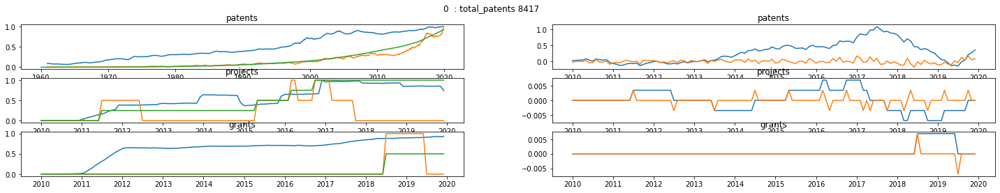

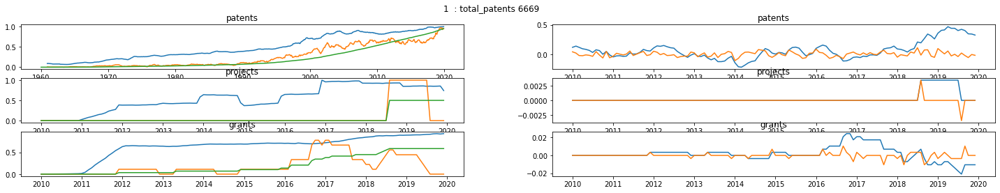

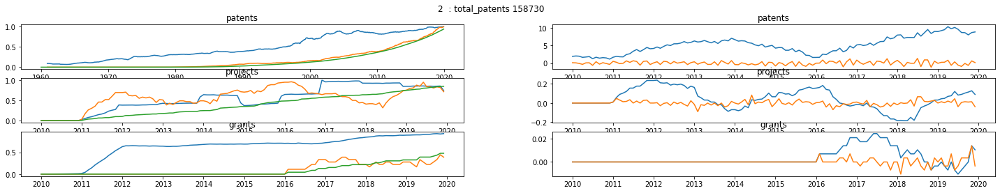

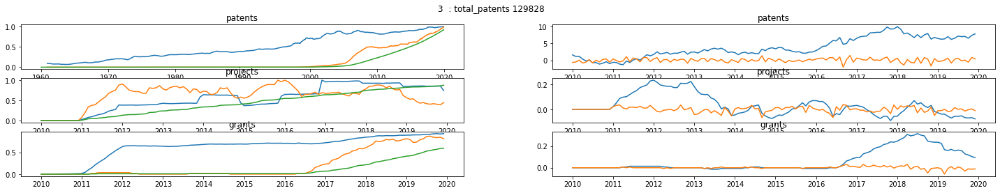

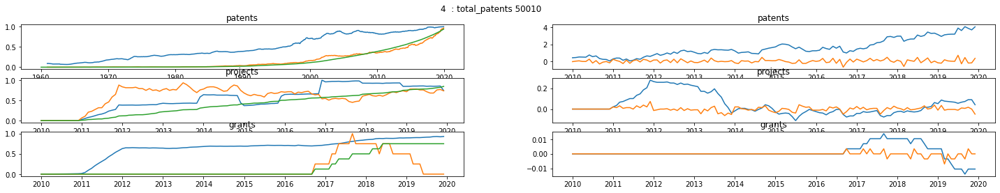

...

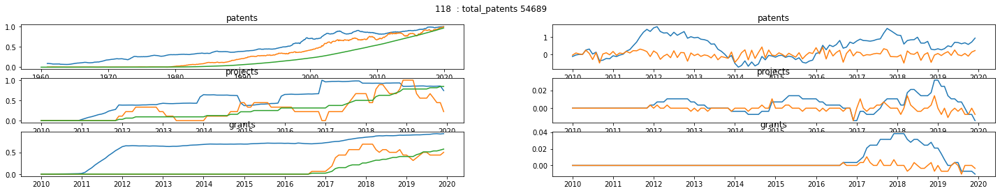

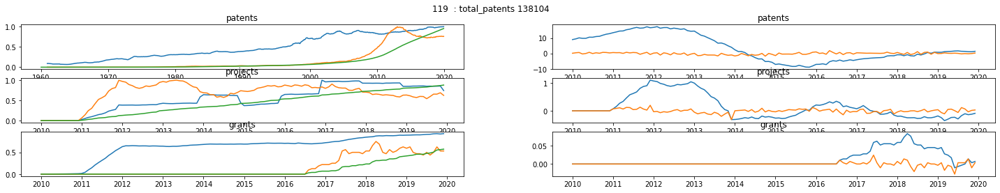

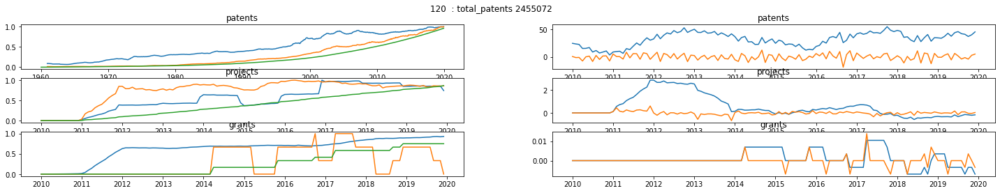

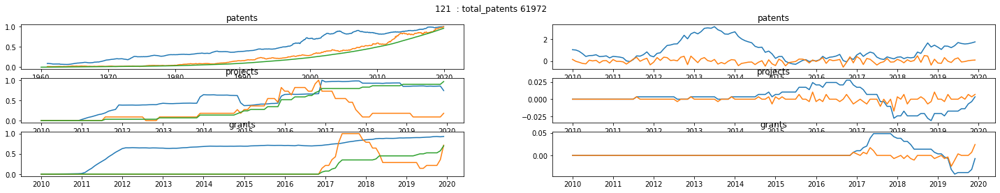

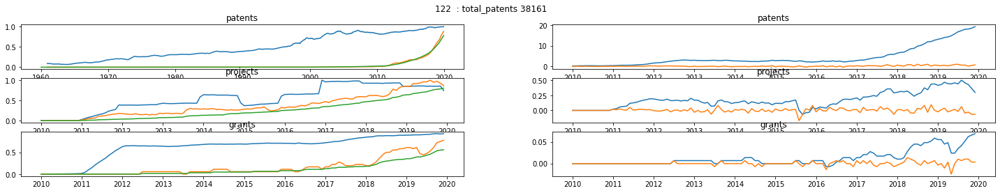

In [143]:
plt.rcParams["figure.figsize"] = (25,4)

#for q in queries[10:15]+queries[-15:-10]:
for q in queries: # remove the [:10] to query all (some error messages will appear because of the number of charts)
  #print(q)
  df = get_query_df(q)

  # RAVINDRA CHANGE THIS TO CHANGE THE PLOTS
  for dataset in datasets:
    df[f'{dataset}_scaled'] = scale(df[[f'{dataset}_MA12']])
    df[f'{dataset}_c_count_scaled'] = scale(df[[f'{dataset}_c_count']])
    df[f'{dataset}_totals_scaled'] = scale(df[[f'{dataset}_totals_MA12']])
    df[f'{dataset}_norm_scaled'] = scale(df[[f'{dataset}_norm_MA12']])
    df[f'{dataset}_diff1_scaled'] = scale(df[[f'{dataset}_diff1_MA12']])
    df[f'{dataset}_diff2_scaled'] = scale(df[[f'{dataset}_diff2_MA12']])
    
    #df[f'{dataset}_totals_MA12_scaled'] = scale(df[[f'{dataset}_totals_MA12']])

  # use one of this lines to control the chart title
  #t = '{} - total_patents {:.0f} - mean_score: {:.4f}'.format(ref_dict[q], df[f'patents'].sum(), df[f'patents_scaled_norm'].mean()) # no label
  t = '{}  : total_patents {:.0f} '.format(ref_dict[q],  df[f'patents'].sum()) # with label

  img = plot_datasets(df, t)
  #img.show()
  img.savefig(f'/gdrive/MyDrive/PISCHOOL/charts_to_label/{ref_dict[q]}.png') # this create the charts in google drive